In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import seaborn as sns

In [2]:
from sklearn import preprocessing,model_selection,neighbors,svm
from sklearn.preprocessing import StandardScaler, RobustScaler, MaxAbsScaler, MinMaxScaler
from sklearn.metrics import accuracy_score, mean_squared_error, mean_absolute_error

from catboost import CatBoostClassifier,CatBoostRegressor,cv,Pool
from tqdm import tqdm as tqdm

In [3]:
#!pip install catboost

In [4]:
path = "input v2.xlsx"
data=pd.read_excel(path,sheet_name="data")
data.head()

,Tarih,Toptan Satis Miktar,Tuplu Satis Miktar,Dokme Satis Miktar,Otogaz Satis Miktar,Toplam Satis Miktar,Limit,Tüpraş Fiyat Değişikliği TL/ton,Tüpraş Fiyat (OTV+Gelir),Year,Month,Day,Weekday,Special_Day_Type_Holiday,Special_Day_Type_Month,Special_Day_Type_Zam,Special_Day_Type_Indirim,Covid Hasta Sayisi,Covid Vefat Sayisi,Vefat/Iyilesen
0,2020-06-01,216800,729273,5961,171280,1123314,0.000000,0.00000,3461.61,2020,6,1,2,0,A0,Z-2,0,827,23,0.023614
1,2020-06-02,336380,712024,7134,657056,1712594,0.054786,293.10305,3461.61,2020,6,2,3,0,A+1,Z-1,0,786,22,0.022587
2,2020-06-03,202420,187235,10074,375137,774866,0.000000,0.00000,3752.43,2020,6,3,4,0,0,Z,0,867,24,0.025779
3,2020-06-04,244140,303234,3724,422513,973611,0.000000,0.00000,3752.43,2020,6,4,5,0,0,Z+1,0,988,21,0.022678
4,2020-06-05,367680,288031,2225,578255,1236191,0.000000,0.00000,3752.43,2020,6,5,6,0,0,0,0,930,18,0.011097


In [5]:
data.set_index("Tarih",inplace=True)

In [6]:
data.describe()

,Toptan Satis Miktar,Tuplu Satis Miktar,Dokme Satis Miktar,Otogaz Satis Miktar,Toplam Satis Miktar,Limit,Tüpraş Fiyat Değişikliği TL/ton,Tüpraş Fiyat (OTV+Gelir),Year,Month,Day,Weekday,Covid Hasta Sayisi,Covid Vefat Sayisi,Vefat/Iyilesen
count,5.930000e+02,5.930000e+02,593.000000,5.930000e+02,5.930000e+02,593.000000,593.000000,593.000000,593.000000,593.000000,593.000000,593.000000,593.000000,593.000000,593.000000
mean,9.265671e+05,3.523099e+05,11187.403035,4.619674e+05,2.004803e+06,0.001850,14.620793,5515.514511,2020.662732,7.290051,15.551433,4.000000,1167.559865,134.952782,0.017808
std,7.164654e+05,2.057858e+05,22323.361981,1.568813e+05,1.233655e+06,0.011503,170.011446,2000.755264,0.520762,3.336457,8.822066,1.997465,1429.487596,88.837468,0.014499
min,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,-0.069987,-2861.644100,3461.610000,2020.000000,1.000000,1.000000,1.000000,0.000000,14.000000,0.003964
25%,4.465600e+05,2.586640e+05,2864.000000,3.849360e+05,1.325322e+06,0.000000,0.000000,4466.280000,2020.000000,5.000000,8.000000,2.000000,0.000000,59.000000,0.007837
50%,8.045600e+05,3.918210e+05,7259.000000,4.743360e+05,1.668586e+06,0.000000,0.000000,4467.260000,2021.000000,8.000000,15.000000,4.000000,846.000000,129.000000,0.012016
75%,1.227720e+06,4.691210e+05,12547.000000,5.595360e+05,2.379542e+06,0.000000,0.000000,5852.940000,2021.000000,10.000000,23.000000,6.000000,1549.000000,203.000000,0.019907
max,9.165980e+06,1.122743e+06,284016.000000,1.102172e+06,1.187850e+07,0.111272,1174.656150,12135.180000,2022.000000,12.000000,31.000000,7.000000,7381.000000,394.000000,0.070107


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 593 entries, 2020-06-01 to 2022-01-14
Data columns (total 19 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Toptan Satis Miktar               593 non-null    int64  
 1   Tuplu Satis Miktar                593 non-null    int64  
 2   Dokme Satis Miktar                593 non-null    int64  
 3   Otogaz Satis Miktar               593 non-null    int64  
 4   Toplam Satis Miktar               593 non-null    int64  
 5   Limit                             593 non-null    float64
 6   Tüpraş Fiyat Değişikliği  TL/ton  593 non-null    float64
 7   Tüpraş Fiyat (OTV+Gelir)          593 non-null    float64
 8   Year                              593 non-null    int64  
 9   Month                             593 non-null    int64  
 10  Day                               593 non-null    int64  
 11  Weekday                           593 non-null    in

In [8]:
data[["Toptan Satis Miktar","Tuplu Satis Miktar","Dokme Satis Miktar","Toplam Satis Miktar","Otogaz Satis Miktar"]] = data[["Toptan Satis Miktar","Tuplu Satis Miktar","Dokme Satis Miktar","Toplam Satis Miktar","Otogaz Satis Miktar"]]/1000

In [10]:
data["Otogaz-7"] = data["Otogaz Satis Miktar"].shift(7)
data["Otogaz-1"] = data["Otogaz Satis Miktar"].shift(1)

data["Toptan-7"] = data["Toptan Satis Miktar"].shift(7)
data["Toptan-1"] = data["Toptan Satis Miktar"].shift(1)

data["Tuplu-7"] = data["Tuplu Satis Miktar"].shift(7)
data["Tuplu-1"] = data["Tuplu Satis Miktar"].shift(1)

data["Dokme-7"] = data["Dokme Satis Miktar"].shift(7)
data["Dokme-1"] = data["Dokme Satis Miktar"].shift(1)

data["Toplam-7"] = data["Toplam Satis Miktar"].shift(7)
data["Toplam-1"] = data["Toplam Satis Miktar"].shift(1)

In [9]:
data["Otogaz-7"] = data["Otogaz Satis Miktar"].shift(7)


data["Toptan-7"] = data["Toptan Satis Miktar"].shift(7)


data["Tuplu-7"] = data["Tuplu Satis Miktar"].shift(7)


data["Dokme-7"] = data["Dokme Satis Miktar"].shift(7)


data["Toplam-7"] = data["Toplam Satis Miktar"].shift(7)


In [11]:
data.dropna(inplace=True)

In [12]:
data.tail()

,Toptan Satis Miktar,Tuplu Satis Miktar,Dokme Satis Miktar,Otogaz Satis Miktar,Toplam Satis Miktar,Limit,Tüpraş Fiyat Değişikliği TL/ton,Tüpraş Fiyat (OTV+Gelir),Year,Month,...,Otogaz-7,Toptan-7,Tuplu-7,Dokme-7,Toplam-7,Otogaz-1,Toptan-1,Tuplu-1,Dokme-1,Toplam-1
Tarih,,,,,,,,,,,,,,,,,,,,,
2022-01-10,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,11681.18,2022,1,...,352.115,747.08,230.438,12.601,1342.234,330.665,722.6,0.406,0.0,1053.671
2022-01-11,0.0,0.0,0.0,0.0,0.0,0.030677,453.45555,11681.18,2022,1,...,358.087,675.80,255.785,19.175,1308.847,0.000,0.0,0.000,0.0,0.000
2022-01-12,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,12135.18,2022,1,...,239.373,821.32,234.766,9.064,1304.523,0.000,0.0,0.000,0.0,0.000
2022-01-13,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,12135.18,2022,1,...,365.679,704.84,268.288,13.983,1352.790,0.000,0.0,0.000,0.0,0.000
2022-01-14,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,12135.18,2022,1,...,436.051,665.54,517.221,15.865,1634.677,0.000,0.0,0.000,0.0,0.000


In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 586 entries, 2020-06-08 to 2022-01-14
Data columns (total 29 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Toptan Satis Miktar               586 non-null    float64
 1   Tuplu Satis Miktar                586 non-null    float64
 2   Dokme Satis Miktar                586 non-null    float64
 3   Otogaz Satis Miktar               586 non-null    float64
 4   Toplam Satis Miktar               586 non-null    float64
 5   Limit                             586 non-null    float64
 6   Tüpraş Fiyat Değişikliği  TL/ton  586 non-null    float64
 7   Tüpraş Fiyat (OTV+Gelir)          586 non-null    float64
 8   Year                              586 non-null    int64  
 9   Month                             586 non-null    int64  
 10  Day                               586 non-null    int64  
 11  Weekday                           586 non-null    in

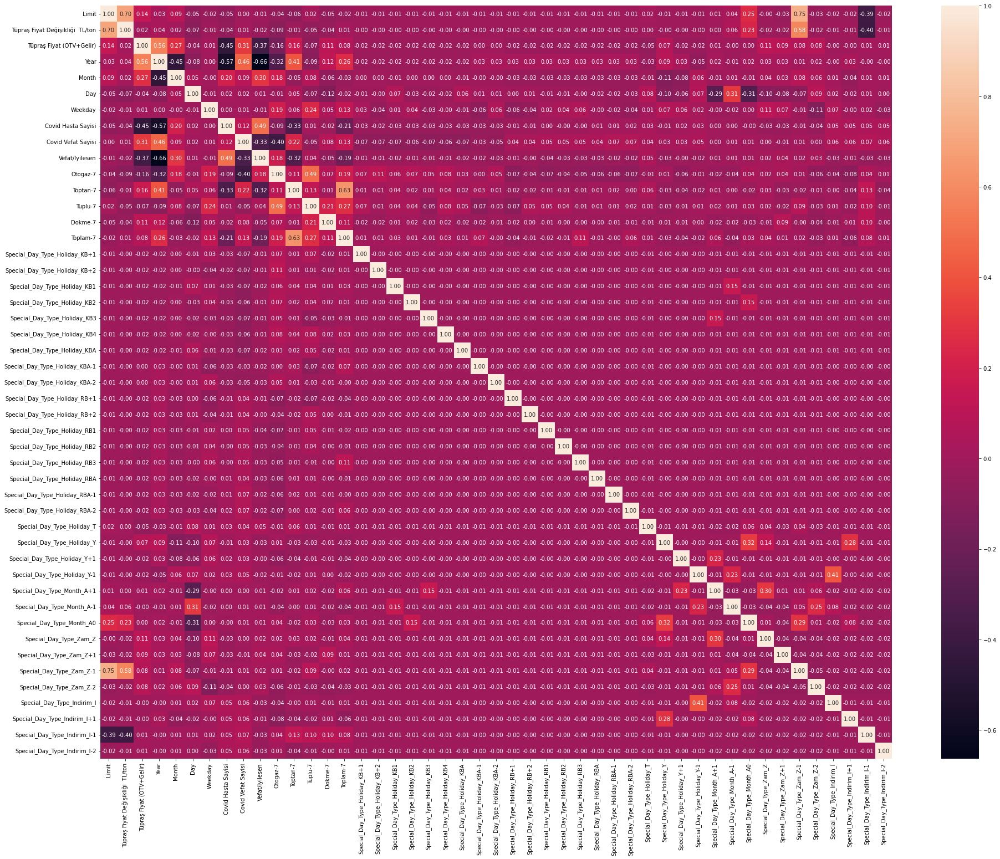

In [518]:
fig, ax = plt.subplots(figsize=(32, 25))
sns.heatmap(X.corr(),  annot=True, fmt=".2f");

In [14]:

X = data.drop(columns=["Toptan Satis Miktar","Tuplu Satis Miktar","Dokme Satis Miktar","Toplam Satis Miktar","Otogaz Satis Miktar"], axis=1)
X.head()

,Limit,Tüpraş Fiyat Değişikliği TL/ton,Tüpraş Fiyat (OTV+Gelir),Year,Month,Day,Weekday,Special_Day_Type_Holiday,Special_Day_Type_Month,Special_Day_Type_Zam,...,Otogaz-7,Toptan-7,Tuplu-7,Dokme-7,Toplam-7,Otogaz-1,Toptan-1,Tuplu-1,Dokme-1,Toplam-1
Tarih,,,,,,,,,,,,,,,,,,,,,
2020-06-08,0.0,0.0,3752.43,2020,6,8,2,0,0,0,...,171.280,216.80,729.273,5.961,1123.314,485.740,360.44,0.780,0.000,846.960
2020-06-09,0.0,0.0,3752.43,2020,6,9,3,0,0,0,...,657.056,336.38,712.024,7.134,1712.594,533.995,407.46,404.246,5.650,1351.351
2020-06-10,0.0,0.0,3752.43,2020,6,10,4,0,0,0,...,375.137,202.42,187.235,10.074,774.866,515.611,396.18,378.589,6.695,1297.075
2020-06-11,0.0,0.0,3752.43,2020,6,11,5,0,0,0,...,422.513,244.14,303.234,3.724,973.611,575.367,304.34,380.192,4.372,1264.271
2020-06-12,0.0,0.0,3752.43,2020,6,12,6,0,0,0,...,578.255,367.68,288.031,2.225,1236.191,538.706,456.16,376.201,5.037,1376.104


In [15]:
X.tail()

,Limit,Tüpraş Fiyat Değişikliği TL/ton,Tüpraş Fiyat (OTV+Gelir),Year,Month,Day,Weekday,Special_Day_Type_Holiday,Special_Day_Type_Month,Special_Day_Type_Zam,...,Otogaz-7,Toptan-7,Tuplu-7,Dokme-7,Toplam-7,Otogaz-1,Toptan-1,Tuplu-1,Dokme-1,Toplam-1
Tarih,,,,,,,,,,,,,,,,,,,,,
2022-01-10,0.000000,0.00000,11681.18,2022,1,10,2,0,0,Z-2,...,352.115,747.08,230.438,12.601,1342.234,330.665,722.6,0.406,0.0,1053.671
2022-01-11,0.030677,453.45555,11681.18,2022,1,11,3,0,0,Z-1,...,358.087,675.80,255.785,19.175,1308.847,0.000,0.0,0.000,0.0,0.000
2022-01-12,0.000000,0.00000,12135.18,2022,1,12,4,0,0,Z,...,239.373,821.32,234.766,9.064,1304.523,0.000,0.0,0.000,0.0,0.000
2022-01-13,0.000000,0.00000,12135.18,2022,1,13,5,0,0,Z+1,...,365.679,704.84,268.288,13.983,1352.790,0.000,0.0,0.000,0.0,0.000
2022-01-14,0.000000,0.00000,12135.18,2022,1,14,6,0,0,0,...,436.051,665.54,517.221,15.865,1634.677,0.000,0.0,0.000,0.0,0.000


In [16]:
X_num = X._get_numeric_data()
X_cat = X.select_dtypes(include=["object"])

In [17]:
X_cat.head()

,Special_Day_Type_Holiday,Special_Day_Type_Month,Special_Day_Type_Zam,Special_Day_Type_Indirim
Tarih,,,,
2020-06-08,0,0,0,0
2020-06-09,0,0,0,0
2020-06-10,0,0,0,0
2020-06-11,0,0,0,0
2020-06-12,0,0,0,0


In [18]:
X_num.head()

,Limit,Tüpraş Fiyat Değişikliği TL/ton,Tüpraş Fiyat (OTV+Gelir),Year,Month,Day,Weekday,Covid Hasta Sayisi,Covid Vefat Sayisi,Vefat/Iyilesen,Otogaz-7,Toptan-7,Tuplu-7,Dokme-7,Toplam-7,Otogaz-1,Toptan-1,Tuplu-1,Dokme-1,Toplam-1
Tarih,,,,,,,,,,,,,,,,,,,,
2020-06-08,0.0,0.0,3752.43,2020,6,8,2,989,19,0.005570,171.280,216.80,729.273,5.961,1123.314,485.740,360.44,0.780,0.000,846.960
2020-06-09,0.0,0.0,3752.43,2020,6,9,3,993,18,0.005594,657.056,336.38,712.024,7.134,1712.594,533.995,407.46,404.246,5.650,1351.351
2020-06-10,0.0,0.0,3752.43,2020,6,10,4,922,17,0.007586,375.137,202.42,187.235,10.074,774.866,515.611,396.18,378.589,6.695,1297.075
2020-06-11,0.0,0.0,3752.43,2020,6,11,5,987,17,0.016650,422.513,244.14,303.234,3.724,973.611,575.367,304.34,380.192,4.372,1264.271
2020-06-12,0.0,0.0,3752.43,2020,6,12,6,1195,15,0.012077,578.255,367.68,288.031,2.225,1236.191,538.706,456.16,376.201,5.037,1376.104


In [19]:
X_num.shape

(586, 20)

In [20]:
X_cat.head()

,Special_Day_Type_Holiday,Special_Day_Type_Month,Special_Day_Type_Zam,Special_Day_Type_Indirim
Tarih,,,,
2020-06-08,0,0,0,0
2020-06-09,0,0,0,0
2020-06-10,0,0,0,0
2020-06-11,0,0,0,0
2020-06-12,0,0,0,0


In [21]:
X_cat_copy= X_cat.copy()
for col in X_cat.columns:
    X_cat_col=pd.get_dummies(X_cat[col],prefix=col,prefix_sep="_",dummy_na=False,drop_first=True)
    X_cat = pd.concat([X_cat.drop(col,axis=1),X_cat_col],axis=1)

In [22]:
X_cat.shape

(586, 32)

In [23]:
X_cat.head()

,Special_Day_Type_Holiday_KB+1,Special_Day_Type_Holiday_KB+2,Special_Day_Type_Holiday_KB1,Special_Day_Type_Holiday_KB2,Special_Day_Type_Holiday_KB3,Special_Day_Type_Holiday_KB4,Special_Day_Type_Holiday_KBA,Special_Day_Type_Holiday_KBA-1,Special_Day_Type_Holiday_KBA-2,Special_Day_Type_Holiday_RB+1,...,Special_Day_Type_Month_A-1,Special_Day_Type_Month_A0,Special_Day_Type_Zam_Z,Special_Day_Type_Zam_Z+1,Special_Day_Type_Zam_Z-1,Special_Day_Type_Zam_Z-2,Special_Day_Type_Indirim_I,Special_Day_Type_Indirim_I+1,Special_Day_Type_Indirim_I-1,Special_Day_Type_Indirim_I-2
Tarih,,,,,,,,,,,,,,,,,,,,,
2020-06-08,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-06-09,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-06-10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-06-11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-06-12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [24]:
X = pd.concat([X_num,X_cat],axis=1)
y = data['Otogaz Satis Miktar']

In [329]:
y.shape

(586,)

In [330]:
y.head()

Tarih
2020-06-08    533.995
2020-06-09    515.611
2020-06-10    575.367
2020-06-11    538.706
2020-06-12    604.258
Name: Otogaz Satis Miktar, dtype: float64

In [ ]:
X_copy = X.copy()

In [33]:
X_num.tail()

,Limit,Tüpraş Fiyat Değişikliği TL/ton,Tüpraş Fiyat (OTV+Gelir),Year,Month,Day,Weekday,Covid Hasta Sayisi,Covid Vefat Sayisi,Vefat/Iyilesen,Otogaz-7,Toptan-7,Tuplu-7,Dokme-7,Toplam-7,Otogaz-1,Toptan-1,Tuplu-1,Dokme-1,Toplam-1
Tarih,,,,,,,,,,,,,,,,,,,,
2022-01-10,0.000000,0.00000,11681.18,2022,1,10,2,0,173,0.00492,352.115,747.08,230.438,12.601,1342.234,330.665,722.6,0.406,0.0,1053.671
2022-01-11,0.030677,453.45555,11681.18,2022,1,11,3,0,173,0.00492,358.087,675.80,255.785,19.175,1308.847,0.000,0.0,0.000,0.0,0.000
2022-01-12,0.000000,0.00000,12135.18,2022,1,12,4,0,173,0.00492,239.373,821.32,234.766,9.064,1304.523,0.000,0.0,0.000,0.0,0.000
2022-01-13,0.000000,0.00000,12135.18,2022,1,13,5,0,173,0.00492,365.679,704.84,268.288,13.983,1352.790,0.000,0.0,0.000,0.0,0.000
2022-01-14,0.000000,0.00000,12135.18,2022,1,14,6,0,173,0.00492,436.051,665.54,517.221,15.865,1634.677,0.000,0.0,0.000,0.0,0.000


## Catboost

In [483]:
%%time

scaler=MinMaxScaler()
scaler.fit(X)
X_scaled = pd.DataFrame(scaler.transform(X), columns=X.columns)
X_scaled.index=X.index
X_scaled.tail(8)

Wall time: 13.4 ms


,Limit,Tüpraş Fiyat Değişikliği TL/ton,Tüpraş Fiyat (OTV+Gelir),Year,Month,Day,Weekday,Covid Hasta Sayisi,Covid Vefat Sayisi,Vefat/Iyilesen,...,Special_Day_Type_Month_A-1,Special_Day_Type_Month_A0,Special_Day_Type_Zam_Z,Special_Day_Type_Zam_Z+1,Special_Day_Type_Zam_Z-1,Special_Day_Type_Zam_Z-2,Special_Day_Type_Indirim_I,Special_Day_Type_Indirim_I+1,Special_Day_Type_Indirim_I-1,Special_Day_Type_Indirim_I-2
Tarih,,,,,,,,,,,,,,,,,,,,,
2022-01-07,0.386114,0.708977,0.945841,1.0,0.0,0.200000,0.833333,0.0,0.376316,0.021367,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-08,0.386114,0.708977,0.945841,1.0,0.0,0.233333,1.000000,0.0,0.334211,0.001694,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-09,0.386114,0.708977,0.945841,1.0,0.0,0.266667,0.000000,0.0,0.418421,0.014453,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-10,0.386114,0.708977,0.945841,1.0,0.0,0.300000,0.166667,0.0,0.418421,0.014453,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2022-01-11,0.555356,0.821321,0.945841,1.0,0.0,0.333333,0.333333,0.0,0.418421,0.014453,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2022-01-12,0.386114,0.708977,1.000000,1.0,0.0,0.366667,0.500000,0.0,0.418421,0.014453,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-13,0.386114,0.708977,1.000000,1.0,0.0,0.400000,0.666667,0.0,0.418421,0.014453,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-14,0.386114,0.708977,1.000000,1.0,0.0,0.433333,0.833333,0.0,0.418421,0.014453,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [487]:
X_scaled_sample = X_scaled[0:-5]
X_scaled_to_predict = X_scaled[-5:]

y_sample=y[0:-5]
y_to_predict=y[-5:]

In [490]:

X_train, X_test, y_train, y_test = model_selection.train_test_split(X_scaled_sample, y_sample, test_size=0.1, shuffle = True)
#X_train, X_valid, y_train, y_valid = model_selection.train_test_split(X_train, y_train, test_size=0.2, shuffle = True)
X_train, X_valid, y_train, y_valid = model_selection.train_test_split(X_train, y_train, test_size=0.1, shuffle = False)
print("Train", X_train.shape, y_train.shape)
print("Valid", X_valid.shape, y_valid.shape)
print("Test", X_test.shape, y_test.shape)

Train (522, 47) (522,)
Test (59, 47) (59,)


In [491]:
model = CatBoostRegressor(iterations=20_000,
                          verbose=200, 
                          boosting_type = 'Ordered',
                          early_stopping_rounds=200,
                          loss_function = 'RMSE',
                          custom_metric = 'MAE',
                          task_type = 'CPU'
                          )

model.fit(X_train, y_train, eval_set=(X_valid, y_valid), use_best_model = True)

Learning rate set to 0.007395
0:	learn: 152.6714604	test: 147.0759564	best: 147.0759564 (0)	total: 11ms	remaining: 3m 39s
200:	learn: 99.3021623	test: 94.4709131	best: 94.4709131 (200)	total: 1.54s	remaining: 2m 31s
400:	learn: 82.8482601	test: 81.3214252	best: 81.3214252 (400)	total: 3.18s	remaining: 2m 35s
600:	learn: 75.4986374	test: 75.7329339	best: 75.7177540 (595)	total: 4.65s	remaining: 2m 30s
800:	learn: 70.6570199	test: 72.2439288	best: 72.2439288 (800)	total: 6.32s	remaining: 2m 31s
1000:	learn: 67.0681300	test: 68.7335541	best: 68.7335541 (1000)	total: 7.71s	remaining: 2m 26s
1200:	learn: 63.7244913	test: 65.7462742	best: 65.7462742 (1200)	total: 9.46s	remaining: 2m 27s
1400:	learn: 60.6191853	test: 63.2456862	best: 63.2456862 (1400)	total: 11.1s	remaining: 2m 27s
1600:	learn: 57.5389455	test: 60.2406413	best: 60.2406413 (1600)	total: 12.8s	remaining: 2m 27s
1800:	learn: 54.9335520	test: 57.6165058	best: 57.6165058 (1800)	total: 14.2s	remaining: 2m 23s
2000:	learn: 52.575387

In [492]:
y_pred = model.predict(X_valid)
print("mean absolute error validation: ", mean_absolute_error(y_valid, y_pred) )

y_pred= model.predict(X_test)
print("mean absolute error test: ", mean_absolute_error(y_test, y_pred) )


y_pred= model.predict(X_test)
print("r2 score: ", r2_score(y_test, y_pred) )

mean absolute error validation:  22.822762118053785
mean absolute error test:  55.124347989287955
r2 score:  0.7013939170378487


In [436]:
model.predict(X_to_predict)

array([443.23273746, 617.76120617, 401.46179623, 428.42252311,
       443.38561152])

## Hyper Parameter Tuning

In [493]:
model_hyp = CatBoostRegressor(                          
                          early_stopping_rounds=100,
                          loss_function = 'RMSE',
                          custom_metric = 'MAE',
                          task_type = 'GPU'
                          )
grid = {
    'boosting_type': ['Ordered', 'Plain'],
    'learning_rate': [0.003, 0.006, 0.009, 0.03, 0.1, 0.5],
    'depth': [4, 6, 10],
    'l2_leaf_reg': [1, 3, 5, 7, 9]
}

In [494]:
X_train_cv = pd.concat([X_train, X_valid])
y_train_cv = pd.concat([y_train, y_valid])

In [495]:
print(" Train", X_train_cv.shape, y_train_cv.shape)

 Train (575, 47) (575,)


In [496]:
X_train_cv.head()

,Limit,Tüpraş Fiyat Değişikliği TL/ton,Tüpraş Fiyat (OTV+Gelir),Year,Month,Day,Weekday,Covid Hasta Sayisi,Covid Vefat Sayisi,Vefat/Iyilesen,...,Special_Day_Type_Month_A-1,Special_Day_Type_Month_A0,Special_Day_Type_Zam_Z,Special_Day_Type_Zam_Z+1,Special_Day_Type_Zam_Z-1,Special_Day_Type_Zam_Z-2,Special_Day_Type_Indirim_I,Special_Day_Type_Indirim_I+1,Special_Day_Type_Indirim_I-1,Special_Day_Type_Indirim_I-2
Tarih,,,,,,,,,,,,,,,,,,,,,
2020-08-26,0.386114,0.708977,0.067335,0.0,0.636364,0.833333,0.500000,0.177889,0.015789,0.241840,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-08-29,0.386114,0.708977,0.250575,0.5,0.636364,0.933333,0.000000,0.000000,0.634211,0.278370,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-09-26,0.386114,0.708977,0.085157,0.0,0.727273,0.833333,1.000000,0.204715,0.150000,0.811360,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-08-10,0.386114,0.708977,0.250575,0.5,0.636364,0.300000,0.333333,0.000000,0.289474,0.065435,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-11-27,0.386114,0.708977,0.808164,0.5,0.909091,0.866667,1.000000,0.000000,0.468421,0.055705,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [497]:
grid_search_results = model_hyp.grid_search(grid, X_train_cv, y_train_cv,verbose =200)

0:	learn: 486.2122457	test: 494.0790819	best: 494.0790819 (0)	total: 17.5ms	remaining: 17.5s
1:	learn: 484.8573076	test: 492.7024854	best: 492.7024854 (1)	total: 36.7ms	remaining: 18.3s
2:	learn: 483.4939144	test: 491.3108641	best: 491.3108641 (2)	total: 50.1ms	remaining: 16.6s
3:	learn: 482.1514105	test: 489.9528637	best: 489.9528637 (3)	total: 66.1ms	remaining: 16.5s
4:	learn: 480.8233699	test: 488.6062699	best: 488.6062699 (4)	total: 79.8ms	remaining: 15.9s
5:	learn: 479.4811326	test: 487.2632892	best: 487.2632892 (5)	total: 94.8ms	remaining: 15.7s
6:	learn: 478.1433658	test: 485.9121051	best: 485.9121051 (6)	total: 112ms	remaining: 15.8s
7:	learn: 476.8213228	test: 484.5815407	best: 484.5815407 (7)	total: 126ms	remaining: 15.6s
8:	learn: 475.5126296	test: 483.2740154	best: 483.2740154 (8)	total: 143ms	remaining: 15.7s
9:	learn: 474.1849025	test: 481.9187375	best: 481.9187375 (9)	total: 158ms	remaining: 15.6s
10:	learn: 472.8714873	test: 480.5924966	best: 480.5924966 (10)	total: 173

In [499]:
grid_search_results['params']

{'depth': 4,
 'l2_leaf_reg': 3,
 'learning_rate': 0.5,
 'boosting_type': 'Ordered'}

In [500]:
catboost_model = CatBoostRegressor(
    early_stopping_rounds = 100,
    verbose = 100,
    boosting_type="Ordered",
    depth=4,
    l2_leaf_reg = 3,
    learning_rate=0.5,
    loss_function="RMSE",
    custom_metric="MAE",
    task_type="CPU"
)


catboost_model.fit(X_train, y_train, eval_set=(X_valid, y_valid), use_best_model = True, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 127.0060921	test: 118.8174479	best: 118.8174479 (0)	total: 47.6ms	remaining: 47.5s
100:	learn: 43.9058108	test: 43.8722225	best: 43.8722225 (100)	total: 262ms	remaining: 2.33s
200:	learn: 34.8405553	test: 37.0611697	best: 37.0448485 (199)	total: 456ms	remaining: 1.81s
300:	learn: 29.4263893	test: 34.2797506	best: 34.1393070 (280)	total: 631ms	remaining: 1.47s
400:	learn: 25.8568004	test: 31.1848674	best: 31.1848674 (400)	total: 829ms	remaining: 1.24s
500:	learn: 23.5233257	test: 30.2844459	best: 30.2769752 (496)	total: 1.01s	remaining: 1.01s
600:	learn: 21.6113196	test: 29.0487748	best: 28.9144883 (586)	total: 1.18s	remaining: 782ms
700:	learn: 19.7566738	test: 28.6251889	best: 28.4558375 (679)	total: 1.37s	remaining: 583ms
800:	learn: 18.0193744	test: 28.5614816	best: 27.9462272 (767)	total: 1.57s	remaining: 390ms
Stopped by overfitting detector  (100 iterations wait)

bestTest = 27.94622723
bestIteration = 767

Shrink model to first 768 iterations.


In [501]:
y_test_preds=catboost_model.predict(X_test)
r2_score(y_test,y_test_preds)

0.67178550078395

In [502]:
mean_squared_error(y_test,y_test_preds)

5560.219412907441

In [503]:
mean_absolute_error(y_test,y_test_preds)

57.6294922194542

In [504]:
df = pd.concat([pd.Series(y_test.values),pd.Series(y_test_preds)], axis=1)
df.columns=["y_test","y_pred"]
df.index=y_test.index
df.head()

,y_test,y_pred
Tarih,,
2021-08-21,572.777,529.892642
2021-02-07,110.991,103.075725
2020-10-16,481.671,553.970936
2021-09-18,600.624,472.862299
2021-04-15,382.955,422.711152


In [505]:
catboost_model.predict(X_to_predict)

array([394.77649231, 654.02996658, 251.33325724, 337.35696324,
       277.49316168])

## Gradient Boosting Method

In [451]:
import pandas as pd
import pickle
import numpy as np
from xlrd import open_workbook
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from scipy.stats import uniform, randint
from sklearn.model_selection import cross_val_score, GridSearchCV, KFold, RandomizedSearchCV, train_test_split
from sklearn.metrics import auc, accuracy_score, confusion_matrix, mean_squared_error
import warnings
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt
from sklearn import ensemble
from sklearn import datasets
from sklearn.utils import shuffle
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.datasets import load_digits
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import GradientBoostingRegressor

In [406]:
X_scaled.shape

(581, 47)

In [407]:
y_sample.shape

(581,)

In [452]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_sample, test_size=0.1,shuffle=False) 

# {'learning_rate': 0.03, 'max_depth': 7, 'n_estimators': 374, 'subsample': 0.3800240596368538}

model = ensemble.GradientBoostingRegressor(learning_rate=0.1,
                          loss='ls', max_depth=3, max_features=None,
                          max_leaf_nodes=None, min_impurity_decrease=0.0,
                          min_samples_leaf=1,
                          min_weight_fraction_leaf=0.0,
                          n_iter_no_change=None,
                          random_state=None,
                          subsample=0.7269, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)


model.fit(X_train , y_train)

C:\Users\ridvan\.conda\envs\SalePriceForecast\lib\site-packages\sklearn\ensemble\_gb.py:286: FutureWarning: The loss 'ls' was deprecated in v1.0 and will be removed in version 1.2. Use 'squared_error' which is equivalent.
  warnings.warn(


GradientBoostingRegressor(loss='ls', subsample=0.7269)

In [453]:
y_test_preds=model.predict(X_test)
r2_score(y_test,y_test_preds)

0.3442657292655824

In [454]:
df = pd.concat([pd.Series(y_test.values),pd.Series(y_test_preds)], axis=1)
df.columns=["y_test","y_pred"]
df.index=y_test.index
df.head()

,y_test,y_pred
Tarih,,
2021-11-12,386.220,453.891992
2021-11-13,560.511,494.005234
2021-11-14,522.167,378.274104
2021-11-15,845.767,637.715991
2021-11-16,182.904,354.651902


In [455]:
mean_absolute_error(y_test,y_test_preds)

111.41269751569521

In [456]:
model.predict(X_to_predict)

array([526.28290357, 649.1942524 , 454.54867267, 510.96151473,
       526.28290357])

In [223]:
X.head()

,Limit,Tüpraş Fiyat Değişikliği TL/ton,Tüpraş Fiyat (OTV+Gelir),Year,Month,Day,Weekday,Otogaz-7,Toptan-7,Tuplu-7,...,Special_Day_Type_Month_A-1,Special_Day_Type_Month_A0,Special_Day_Type_Zam_Z,Special_Day_Type_Zam_Z+1,Special_Day_Type_Zam_Z-1,Special_Day_Type_Zam_Z-2,Special_Day_Type_Indirim_I,Special_Day_Type_Indirim_I+1,Special_Day_Type_Indirim_I-1,Special_Day_Type_Indirim_I-2
Tarih,,,,,,,,,,,,,,,,,,,,,
2020-06-08,0.0,0.0,3752.43,2020,6,8,2,171.280,216.80,729.273,...,0,0,0,0,0,0,0,0,0,0
2020-06-09,0.0,0.0,3752.43,2020,6,9,3,657.056,336.38,712.024,...,0,0,0,0,0,0,0,0,0,0
2020-06-10,0.0,0.0,3752.43,2020,6,10,4,375.137,202.42,187.235,...,0,0,0,0,0,0,0,0,0,0
2020-06-11,0.0,0.0,3752.43,2020,6,11,5,422.513,244.14,303.234,...,0,0,0,0,0,0,0,0,0,0
2020-06-12,0.0,0.0,3752.43,2020,6,12,6,578.255,367.68,288.031,...,0,0,0,0,0,0,0,0,0,0


## Parameter Tuning 

In [457]:
X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, y_sample, test_size=0.2)


# Define the grid of hyperparameters to search

parameters = {'learning_rate': [0.03, 0.1, 0.5,1],
              'subsample': sp_randFloat(),
              'max_depth': [3,4,5,6,7,8]
              }

gradientboost = GradientBoostingRegressor()

random_cv = RandomizedSearchCV(estimator=gradientboost,
                               param_distributions=parameters,
                               cv=5, n_iter=1500, n_jobs=-1)

random_cv.fit(X_train,Y_train)

print(random_cv.best_estimator_,1)
# Results from Random Search
print("\n========================================================")
print(" Results from Random Search ")
print("========================================================")

print("\n The best estimator across ALL searched params:\n",
      random_cv.best_estimator_)

print("\n The best score across ALL searched params:\n",
      random_cv.best_score_)

print("\n The best parameters across ALL searched params:\n",
      random_cv.best_params_)
print("\n ========================================================")


GradientBoostingRegressor(subsample=0.305595263551766) 1

 Results from Random Search 

 The best estimator across ALL searched params:
 GradientBoostingRegressor(subsample=0.305595263551766)

 The best score across ALL searched params:
 0.6295142697810887

 The best parameters across ALL searched params:
 {'learning_rate': 0.1, 'max_depth': 3, 'subsample': 0.305595263551766}



In [366]:
X_scaled.shape

(581, 44)

In [458]:
random_cv.best_score_

0.6295142697810887

In [459]:
random_cv.predict(X_to_predict)

array([296.546838  , 368.73611498, 207.94127142, 295.73292824,
       295.73292824])

# SVM

In [296]:
%%time
scaler=StandardScaler()
scaler.fit(X)
X = pd.DataFrame(scaler.transform(X), columns=X.columns)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .20, random_state=42) 

Wall time: 10 ms


In [297]:
X_train.head()

,Limit,Tüpraş Fiyat Değişikliği TL/ton,Tüpraş Fiyat (OTV+Gelir),Year,Month,Day,Weekday,Otogaz-7,Otogaz-1,Toptan-7,...,Special_Day_Type_Holiday_Y,Special_Day_Type_Holiday_Y+1,Special_Day_Type_Holiday_Y-1,Special_Day_Type_Month_A+1,Special_Day_Type_Month_A-1,Special_Day_Type_Month_A0,Special_Day_Type_Zam_Z,Special_Day_Type_Zam_Z+1,Special_Day_Type_Zam_Z-1,Special_Day_Type_Zam_Z-2
248,-0.153998,-0.080318,-0.525547,0.698891,-1.639192,-0.540563,0.502819,-0.306032,-0.368031,0.043819,...,-0.058926,-0.041631,-0.041631,-0.184362,-0.184362,-0.184362,-0.229833,-0.22563,-0.23806,-0.233975
275,-0.153998,-0.080318,-0.525547,0.698891,-1.335229,-0.654097,0.001734,-0.191014,0.131611,0.158600,...,-0.058926,-0.041631,-0.041631,-0.184362,-0.184362,-0.184362,-0.229833,-0.22563,-0.23806,-0.233975
68,-0.153998,-0.080318,-0.652737,-1.310854,0.184587,-0.086427,1.504991,2.162095,1.207494,-0.700051,...,-0.058926,-0.041631,-0.041631,-0.184362,-0.184362,-0.184362,-0.229833,-0.22563,-0.23806,-0.233975
469,-0.153998,-0.080318,0.215349,0.698891,0.488550,0.481243,-1.000437,1.085388,-0.222946,0.857074,...,-0.058926,-0.041631,-0.041631,-0.184362,-0.184362,-0.184362,-0.229833,-0.22563,-0.23806,-0.233975
63,-0.153998,-0.080318,-0.652737,-1.310854,0.184587,-0.654097,-1.000437,2.398847,0.552716,-0.497341,...,-0.058926,-0.041631,-0.041631,-0.184362,-0.184362,-0.184362,-0.229833,-0.22563,-0.23806,-0.233975


In [427]:
# importing our model from sklearn library
from sklearn import svm
# initializing this model
model_svm = svm.SVC()

In [429]:
model_svm.fit(X_train, y_train.apply(lambda x: int(x)))
print(model_svm)

SVC()


In [430]:
y_pred = model_svm.predict(X_test)
r2_score(y_test,y_pred)

-0.4268054208892662

In [317]:
mean_absolute_error(y_test,y_pred)

127.71605172413791

In [306]:
y_train_int = y_train.apply(lambda x: int(x))


In [431]:
model_svm.predict(X_to_predict)

array([533, 533, 533, 533, 533], dtype=int64)

# Random Forest 

In [28]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state = 42)
from pprint import pprint

In [39]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(1, 20, num = 10)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [1, 3, 5, 7, 9, 11, 13, 15, 17, 20, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [43]:
X_sample=X[:-5]
y_sample=y[:-5]

X_train, X_test, y_train, y_test = train_test_split(X_sample, y_sample, test_size=0.2)

In [40]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [1, 3, 5, 7, 9, 11, 13, 15,
                                                      17, 20, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [41]:
rf_random.best_params_

{'n_estimators': 400,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 17,
 'bootstrap': False}

In [44]:
rf_tuned = RandomForestRegressor(n_estimators=400,
                                  min_samples_split=2,
                                   min_samples_leaf=1,max_features='sqrt',max_depth=17,bootstrap=False)   

rf_tuned.fit(X_train, y_train)             

RandomForestRegressor(bootstrap=False, max_depth=17, max_features='sqrt',
                      n_estimators=400)

In [45]:
r2_score(y_test, rf_tuned.predict(X_test))

0.6177338946355488

In [46]:
rf_tuned.predict(X[-5:])

array([362.62591231, 393.36187529, 322.28359986, 337.57374354,
       354.81957261])

In [47]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [49]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)
grid_search.best_params_

Fitting 3 folds for each of 288 candidates, totalling 864 fits


{'bootstrap': True,
 'max_depth': 100,
 'max_features': 3,
 'min_samples_leaf': 3,
 'min_samples_split': 12,
 'n_estimators': 100}

# Catboost Classifier and hyperparameter tuning using Bayes

In [62]:
import os
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn import metrics
import numpy as np
import pandas as pd
from time import time
import pprint
import joblib
import warnings
warnings.filterwarnings("ignore")

# Classifiers
from catboost import CatBoostClassifier

# Model selection
from sklearn.model_selection import StratifiedKFold

# Metrics
from sklearn.metrics import roc_auc_score
from sklearn.metrics import make_scorer

# Skopt functions
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, VerboseCallback, DeltaXStopper
from skopt.space import Real, Categorical, Integer
from time import time

In [89]:
%%time
base_model = CatBoostClassifier(task_type = "GPU",verbose=True)
base_model.fit(X_train,y_train,)

Learning rate set to 0.036528
0:	learn: 151.2331852	total: 27.6ms	remaining: 27.5s
1:	learn: 148.5181328	total: 52.6ms	remaining: 26.3s
2:	learn: 145.8500204	total: 74.1ms	remaining: 24.6s
3:	learn: 143.4988135	total: 96.2ms	remaining: 23.9s
4:	learn: 141.1363672	total: 116ms	remaining: 23.1s
5:	learn: 138.7471575	total: 138ms	remaining: 22.8s
6:	learn: 136.6783523	total: 161ms	remaining: 22.9s
7:	learn: 134.7702547	total: 183ms	remaining: 22.6s
8:	learn: 132.7155980	total: 201ms	remaining: 22.1s
9:	learn: 130.8598635	total: 221ms	remaining: 21.8s
10:	learn: 128.9980954	total: 241ms	remaining: 21.7s
11:	learn: 127.1310839	total: 260ms	remaining: 21.4s
12:	learn: 125.5455852	total: 277ms	remaining: 21s
13:	learn: 123.9796850	total: 298ms	remaining: 21s
14:	learn: 122.4626394	total: 319ms	remaining: 20.9s
15:	learn: 120.8561413	total: 340ms	remaining: 20.9s
16:	learn: 119.4157066	total: 359ms	remaining: 20.8s
17:	learn: 117.6933799	total: 379ms	remaining: 20.7s
18:	learn: 116.4961521	tot

In [90]:
r2_score(y_test,base_model.predict(X_test))

0.6158432653034792

In [91]:
base_model.predict(X[-5:])

array([366.11921072, 369.54111162, 364.84666876, 310.83893887,
       301.71359852])

In [92]:
# Reporting util for different optimizers
def report_perf(optimizer, X, y, title, callbacks=None):
    """
    A wrapper for measuring time and performances of different optmizers
    
    optimizer = a sklearn or a skopt optimizer
    X = the training set 
    y = our target
    title = a string label for the experiment
    """
    start = time()
    if callbacks:
        optimizer.fit(X, y, callback=callbacks)
    else:
        optimizer.fit(X, y)
    d=pd.DataFrame(optimizer.cv_results_)
    best_score = optimizer.best_score_
    best_score_std = d.iloc[optimizer.best_index_].std_test_score
    best_params = optimizer.best_params_
    print((title + " took %.2f seconds,  candidates checked: %d, best CV score: %.3f "
           +u"\u00B1"+" %.3f") % (time() - start, 
                                  len(optimizer.cv_results_['params']),
                                  best_score,
                                  best_score_std))    
    print('Best parameters:')
    pprint.pprint(best_params)
    print()
    return best_params

In [79]:
# Converting average precision score into a scorer suitable for model selection
roc_auc = make_scorer(roc_auc_score, greater_is_better=True, needs_threshold=True)


In [93]:
# Setting a 5-fold stratified cross-validation (note: shuffle=True)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

In [94]:
# Initializing a CatBoostClassifier
clf = CatBoostClassifier(task_type = "GPU",verbose=True)

In [95]:
# Defining your search space
search_spaces = {'iterations': Integer(10, 300),
                 'depth': Integer(1, 8),
                 'learning_rate': Real(0.01, 1.0, 'log-uniform'),
                 'random_strength': Real(1e-9, 10, 'log-uniform'),
                 'bagging_temperature': Real(0.0, 1.0),
                 'border_count': Integer(1, 255),
                 'l2_leaf_reg': Integer(2, 30),
                 'scale_pos_weight':Real(0.01, 1.0, 'uniform')}

In [96]:
# Setting up BayesSearchCV
opt = BayesSearchCV(clf,
                    search_spaces,
                    scoring=roc_auc,
                    cv=skf,
                    n_iter=100,
                    n_jobs=1,  # use just 1 job with CatBoost in order to avoid segmentation fault
                    return_train_score=False,
                    refit=True,
                    optimizer_kwargs={'base_estimator': 'GP'},
                    random_state=42)

In [97]:
# Running the optimization
best_params = report_perf(opt, X, y,'CatBoost', 
                          callbacks=[VerboseCallback(100), 
                                     DeadlineStopper(60*10)])

Iteration No: 1 started. Searching for the next optimal point.


ValueError: Supported target types are: ('binary', 'multiclass'). Got 'continuous' instead.